<a href="https://colab.research.google.com/github/wenchun0731/city-hunter/blob/main/crosswalk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


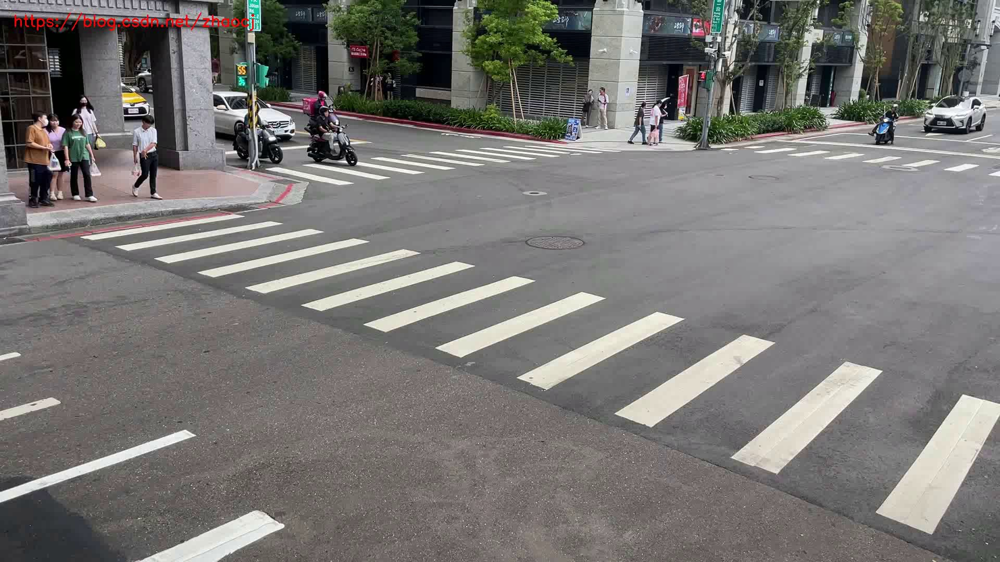

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
image=cv2.imread('/content/drive/MyDrive/Finetune/Licence_Finetune/FrameOutput/frame_0000.jpg')
image2=image.copy()
cv2_imshow(image2)

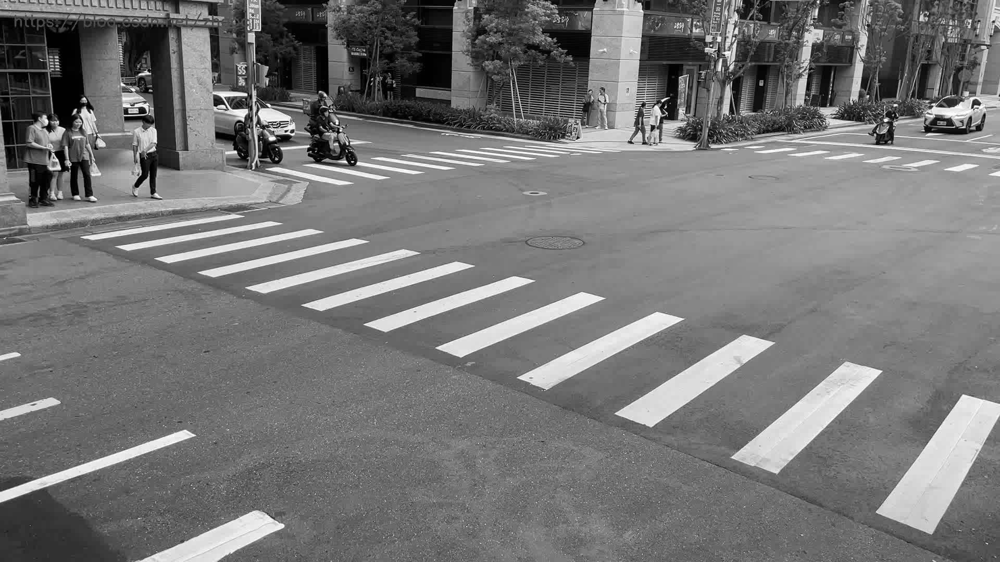

In [ ]:
gray_img = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
from google.colab.patches import cv2_imshow
cv2_imshow(gray_img)


In [ ]:
# import numpy as np

# mask=np.ones_like(gray_img)*0
# h,w=mask.shape[0:]
# # print(h,w)
# mask[400:h,200:w]=255
# # mask[0:h,0:w]=255
# mask_edges=cv2.bitwise_and(gray_img,mask)
# cv2_imshow(mask_edges)


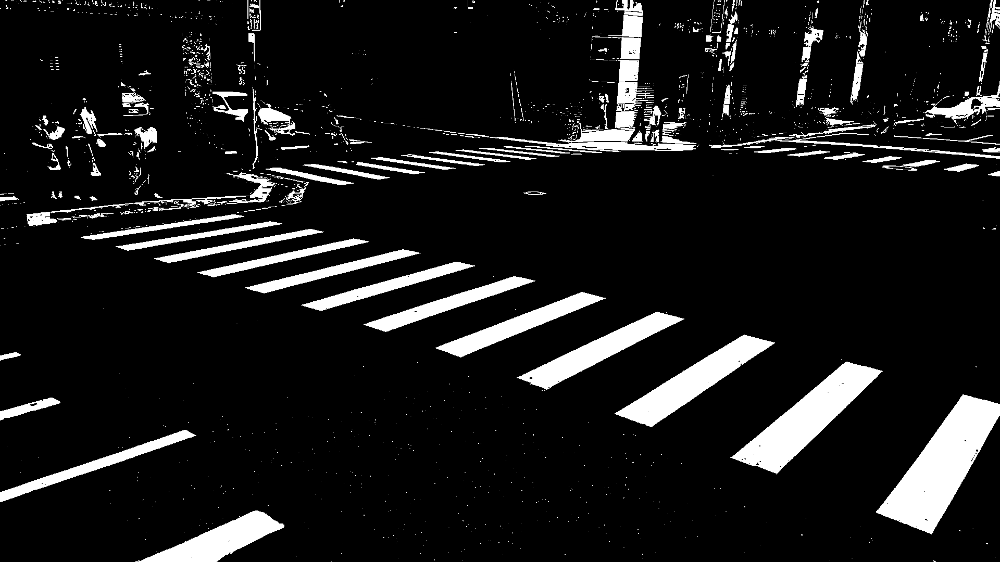

In [ ]:
threshold_value = 180  # 可以根據需要調整
max_value = 255
_, binary_image = cv2.threshold(gray_img, threshold_value, max_value, cv2.THRESH_BINARY)
cv2_imshow(binary_image)


[[[ 545 1008]]

 [[ 489  981]]

 [[ 259 1079]]

 [[ 416 1079]]]
ok
[[[376 836]]

 [[353 826]]

 [[  0 945]]

 [[  0 964]]]
ok
[[[1694  713]]

 [[1622  696]]

 [[1402  879]]

 [[1491  911]]]
ok
[[[1487  658]]

 [[1428  643]]

 [[1180  794]]

 [[1250  820]]]
ok
[[[1313  612]]

 [[1258  600]]

 [[ 992  726]]

 [[1050  748]]]
ok
[[[1162  572]]

 [[1116  561]]

 [[ 836  668]]

 [[ 885  686]]]
ok
[[[1027  539]]

 [[ 981  532]]

 [[ 698  623]]

 [[ 745  636]]]
ok
[[[911 510]]

 [[872 503]]

 [[578 586]]

 [[616 597]]]
ok
[[[807 486]]

 [[772 479]]

 [[471 553]]

 [[507 563]]]
ok
[[[708 464]]

 [[678 458]]

 [[379 523]]

 [[411 532]]]
ok
[[[621 445]]

 [[592 440]]

 [[296 497]]

 [[325 505]]]
ok
[[[541 429]]

 [[517 425]]

 [[222 474]]

 [[247 481]]]
ok


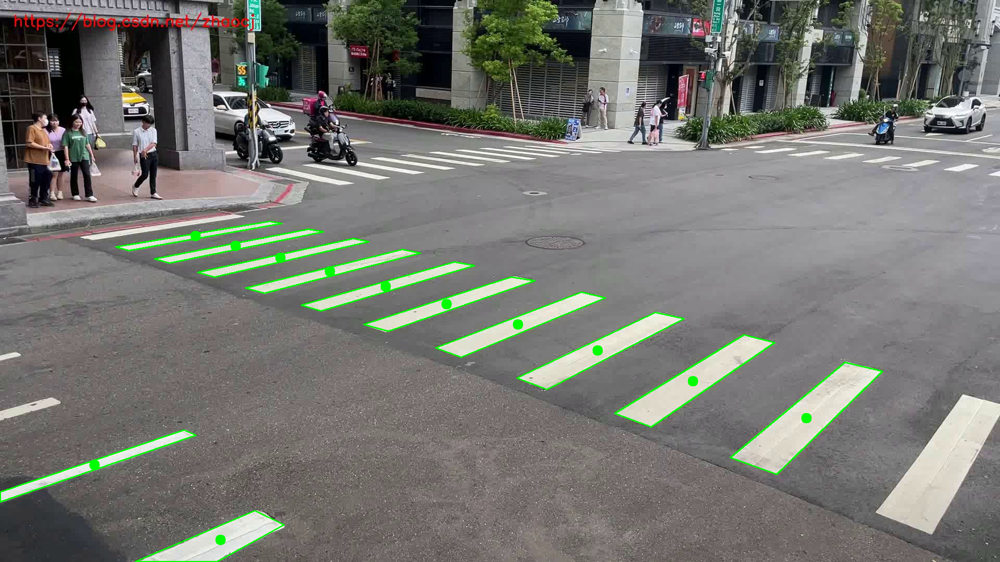

In [23]:
contours, hierarchy = cv2.findContours(binary_image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
approx_all=[]
point_all=[]
h,w=binary_image.shape[0:]

for contour in contours:
    #計算面積，看面積有沒有大於1000

    area=cv2.contourArea(contour)
    if area>2000:

      # 使用多邊形逼近法來取得簡化的頂點
      epsilon = 0.01 * cv2.arcLength(contour, True)
      approx = cv2.approxPolyDP(contour, epsilon, True)

      # 檢查是否為四邊形
      if len(approx) == 4:
          # 計算邊的長度比和角度，確認是否為平行四邊形
          # 這裡可以加入計算平行邊的判斷邏輯
          M = cv2.moments(contour)
          if M['m00'] != 0:
              cx = int(M['m10'] / M['m00'])
              cy = int(M['m01'] / M['m00'])

              point_all.append([cx,cy])
              approx_all.append(approx)
              # 在圖像上標記中心點
              cv2.circle(image, (cx, cy), 10, (0, 255, 0), -1)

cv2.drawContours(image, approx_all, -1, (0, 255, 0), 2)

cv2_imshow(image)
image=image2.copy()


moments圖像矩:計算圖像的特徵量

M[m00]面積

M[m01]一階矩

1. 計算間距
2. 研究DBSCAN


在每一個輪廓中，找到輪廓的中心點
所有中心點比對DBSCAN
找到核心點，只取核心點之前的輪廓
找到輪廓的斜率，決定使用x還是y軸排序
分別放入上線及下線的list
只用list製作擬和直線

會有兩組演算法
根據核心點的擬和值線的斜率
決定他是哪個方向

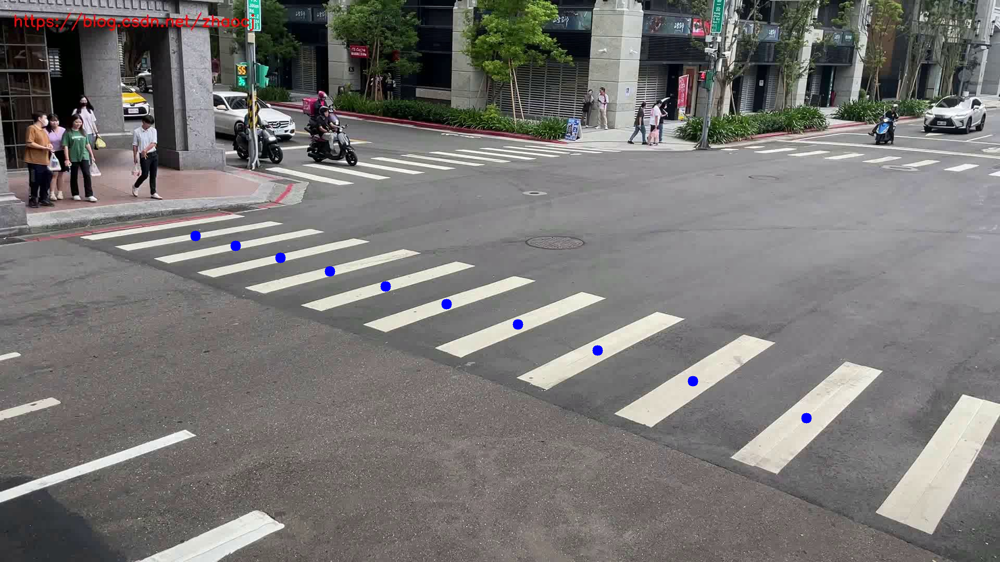

In [ ]:
from sklearn.cluster import DBSCAN
# 設定 DBSCAN 參數
epsilon = 250  # 鄰域距離閾值，視情況調整
min_points = 2  # 至少包含的點數
pointx=[]
pointy=[]
contous_id=[]
# 初始化 DBSCAN 模型
dbscan = DBSCAN(eps=epsilon, min_samples=min_points)
clusters = dbscan.fit_predict(point_all)

# 輸出結果
for i, cluster_id in enumerate(clusters):
    x,y=point_all[i]
    if cluster_id != -1:  # -1 表示噪聲
        cv2.circle(image, (x, y), 10, (255, 0, 0), -1)
        pointx.append(x)
        pointy.append(y)
        contous_id.append(i)
        # print(f"Point {i+1} belongs to cluster {cluster_id}")
    # else:
    #     cv2.circle(image, (cx, cy), 10, (0, 0, 255), -1)
cv2_imshow(image)

回去抓一樣id的輪廓

In [17]:
print(contous_id)

[2, 3, 4, 5, 6, 7, 8, 9, 10, 11]


篩選要的輪廓

In [24]:
contour_sort=[] # 要保留的輪廓

for i in contous_id:
  contour_sort.append(approx_all[i])

print(contour_sort)

[array([[[1694,  713]],

       [[1622,  696]],

       [[1402,  879]],

       [[1491,  911]]], dtype=int32), array([[[1487,  658]],

       [[1428,  643]],

       [[1180,  794]],

       [[1250,  820]]], dtype=int32), array([[[1313,  612]],

       [[1258,  600]],

       [[ 992,  726]],

       [[1050,  748]]], dtype=int32), array([[[1162,  572]],

       [[1116,  561]],

       [[ 836,  668]],

       [[ 885,  686]]], dtype=int32), array([[[1027,  539]],

       [[ 981,  532]],

       [[ 698,  623]],

       [[ 745,  636]]], dtype=int32), array([[[911, 510]],

       [[872, 503]],

       [[578, 586]],

       [[616, 597]]], dtype=int32), array([[[807, 486]],

       [[772, 479]],

       [[471, 553]],

       [[507, 563]]], dtype=int32), array([[[708, 464]],

       [[678, 458]],

       [[379, 523]],

       [[411, 532]]], dtype=int32), array([[[621, 445]],

       [[592, 440]],

       [[296, 497]],

       [[325, 505]]], dtype=int32), array([[[541, 429]],

       [[517, 425]]

依照斜率區分要執行哪個演算法

In [28]:
# 以y軸區分演算法
low_y_point=[]
up_y_point=[]
def contour_sort_y(contour_sort,collabor):
  sorted_array = [sorted(myarray, key=lambda x: x[0][collabor]) for myarray in contour_sort]
  for contour in sorted_array:
    low_y_point.append(contour[:2])
    up_y_point.append(contour[2:])
  return up_y_point,low_y_point


In [12]:
import matplotlib.pyplot as plt
import numpy as np

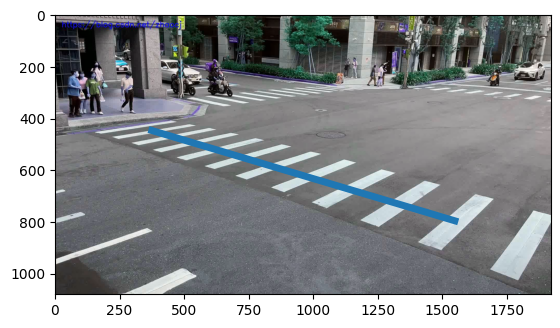

In [29]:
# 擬合直線
#用來計算多項式的最佳擬合係數
coefficients = np.polyfit(pointx, pointy, 1)
# 提取斜率和截距
linear_fit = np.poly1d(coefficients)
slope=round(coefficients[0],3)
intercept=round(coefficients[1],3)
coefficients_o=[slope,intercept]
#當x等於多少的時候y等於多少
linear_fit_o = np.poly1d(coefficients_o)

# coefficients_one=[slope+0.04,intercept+70]
# #當x等於多少的時候y等於多少

# linear_fit_one = np.poly1d(coefficients_one)

# coefficients_two=[slope-0.075,intercept-25]
# linear_fit_two = np.poly1d(coefficients_two)
# 繪製原始點和擬合的直線
plt.imshow(image)
# plt.plot(pointx, linear_fit_two(pointx), linewidth=5)  # 擬合直線
plt.plot(pointx, linear_fit_o(pointx), linewidth=5)  # 擬合直線
# plt.plot(pointx, linear_fit_two(pointx), linewidth=3)  # 擬合直線
if 1>=abs(slope)>=0:
  #以y軸區分的演算法

  contour_sort_y(contour_sort,1)

else:
  #以x軸區分的演算法
  contour_sort_y(contour_sort,0)



# 顯示圖形
plt.show()

In [41]:
def change_to_simple_data(numpy_points):
  simple_data=[[point.tolist() for point in points] for points in numpy_points]
  return simple_data

def coefficients_line(pointx,pointy):
  coefficients = np.polyfit(pointx,pointy, 1)
  linear_fit = np.poly1d(coefficients)
  slope=round(coefficients[0],3)
  intercept=round(coefficients[1],3)
  return slope,intercept


SyntaxError: incomplete input (<ipython-input-41-9bed79cf7f14>, line 1)

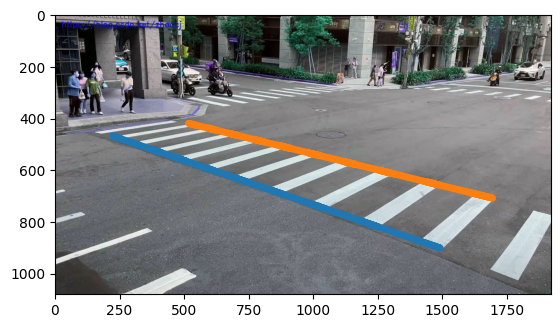

In [44]:

pointx=[point[0][0] for points in simple_data for point in points]
pointy=[point[0][1] for points in simple_data for point in points]

# coefficients = np.polyfit(pointx,pointy, 1)
# linear_fit = np.poly1d(coefficients)
# slope=round(coefficients[0],3)
# intercept=round(coefficients[1],3)
# coefficients_o=[slope,intercept]
# #當x等於多少的時候y等於多少
# linear_fit_o = np.poly1d(coefficients_o)
# plt.plot(pointx, linear_fit_o(pointx), linewidth=5)  # 擬合直線

# pointx=[point[0][0] for points in simple_data_low for point in points]
# pointy=[point[0][1] for points in simple_data_low for point in points]

# coefficients = np.polyfit(pointx,pointy, 1)
# linear_fit = np.poly1d(coefficients)
# slope=round(coefficients[0],3)
# intercept=round(coefficients[1],3)
# coefficients_o=[slope,intercept]
# #當x等於多少的時候y等於多少
# linear_fit_o = np.poly1d(coefficients_o)

# plt.imshow(image)
# # plt.plot(pointx, linear_fit_two(pointx), linewidth=5)  # 擬合直線
# plt.plot(pointx, linear_fit_o(pointx), linewidth=5)  # 擬合直線
# plt.show()

斜率絕對值，在1與0之間以y軸區分

斜率大於1以x軸區分

也就是兩套演算法



In [30]:
print(slope)

0.298


In [55]:
from google.colab import drive
from google.colab.patches import cv2_imshow
from sklearn.cluster import DBSCAN
import numpy as np
import cv2
import matplotlib.pyplot as plt

drive.mount('/content/drive')
image=cv2.imread('/content/drive/MyDrive/Finetune/Licence_Finetune/FrameOutput/frame_0000.jpg')

class find_up_and_low_slope:
    def __init__(self):
      pass

    def main_findupandlow_slope(self,numpy_point):
      pointx,pointy=self.change_to_simple_data(numpy_point)
      return self.coefficients_line(pointx,pointy)

    #輸出上下線的pointx,pointy
    def change_to_simple_data(self,numpy_point):
      simple_data=[[point.tolist() for point in points] for points in numpy_point]
      pointx=[point[0][0] for points in simple_data for point in points]
      pointy=[point[0][1] for points in simple_data for point in points]
      return pointx,pointy

    def coefficients_line(self,pointx,pointy):
      coefficients = np.polyfit(pointx,pointy, 1)
      linear_fit = np.poly1d(coefficients)
      slope=round(coefficients[0],3)
      intercept=round(coefficients[1],3)
      return slope,intercept

class identify_crosswalk:
  def __init__(self,image):
    self.image=image
    self.h=self.image.shape[0]
    self.w=self.image.shape[1]


  def main_crosswalk(self):
    gray_image=self.opencv_gray()
    binary_image=self.opencv_binary(gray_image)
    point_all,approx_all=self.opencv_contours(binary_image)
    contours_sort,slope=self.opencv_dbscan(point_all,approx_all)
    up_line_information,low_line_information=self.slope_judge(contours_sort,slope[0])
    return point_all,up_line_information,low_line_information

  def opencv_gray(self):
    gray_img = cv2.cvtColor(self.image,cv2.COLOR_BGR2GRAY)

    return gray_img

  def opencv_binary(self,image):
    threshold_value = 180  # 可以根據需要調整
    max_value = 255
    _, binary_image = cv2.threshold(image, threshold_value, max_value, cv2.THRESH_BINARY)
    return binary_image

  def opencv_contours(self,image):
    contours, hierarchy = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    # 所有要得輪廓
    approx_all=[]
    # 所有要得中心點
    point_all=[]

    for contour in contours:
        #計算面積，看面積有沒有大於1000

        area=cv2.contourArea(contour)
        if area>2000:

          # 使用多邊形逼近法來取得簡化的頂點
          epsilon = 0.01 * cv2.arcLength(contour, True)
          approx = cv2.approxPolyDP(contour, epsilon, True)

          # 檢查是否為四邊形
          if len(approx) == 4:
              # 計算邊的長度比和角度，確認是否為平行四邊形
              # 這裡可以加入計算平行邊的判斷邏輯
              M = cv2.moments(contour)
              if M['m00'] != 0:
                  cx = int(M['m10'] / M['m00'])
                  cy = int(M['m01'] / M['m00'])

                  point_all.append([cx,cy])
                  approx_all.append(approx)
    return point_all,approx_all

  #找到要得中心點的擬合直線，使用斜率判斷contour_line_sort演算法
  def opencv_dbscan(self,point_all,approx_all):
    pointx=[]
    pointy=[]
    contours_sort=[] # 要保留的輪廓
    # 設定 DBSCAN 參數
    epsilon = 250  # 鄰域距離閾值，視情況調整
    min_points = 2  # 至少包含的點數

    # 初始化 DBSCAN 模型
    dbscan = DBSCAN(eps=epsilon, min_samples=min_points)
    clusters = dbscan.fit_predict(point_all)

    # 輸出結果
    for i, cluster_id in enumerate(clusters):
        x,y=point_all[i]
        if cluster_id != -1:  # -1 表示噪聲
            # cv2.circle(image, (x, y), 10, (255, 0, 0), -1)
            pointx.append(x)
            pointy.append(y)

            contours_sort.append(approx_all[i])
    slope=find_up_and_low_slope()
    slope=slope.coefficients_line(pointx,pointy)
    return contours_sort,slope

  #找到上下線的點點，輸出斜率與截距
  def contour_line_sort(self,contour_sort,collabor):
    low_line_point=[]
    up_line_point=[]
    sorted_array = [sorted(myarray, key=lambda x: x[0][collabor]) for myarray in contour_sort]
    for contour in sorted_array:
      low_line_point.append(contour[:2])
      up_line_point.append(contour[2:])

    up=find_up_and_low_slope()
    up_line_slope=up.main_findupandlow_slope(up_line_point)
    low=find_up_and_low_slope()
    low_line_slope=low.main_findupandlow_slope(low_line_point)

    return up_line_slope,low_line_slope



  # 以y軸區分演算法



  def slope_judge(self,contour_sort,slope):
    if 1>=abs(slope)>=0:
      #以y軸區分的演算法
      return self.contour_line_sort(contour_sort,1)
    else:
      #以x軸區分的演算法
      return self.contour_line_sort(contour_sort,0)

information=identify_crosswalk(image)
point_all,up_information,low_information=information.main_crosswalk()
print(point_all,up_information,low_information)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[[423, 1037], [181, 893], [1548, 803], [1330, 732], [1147, 673], [994, 623], [857, 584], [740, 550], [633, 521], [538, 495], [452, 472], [375, 453]] (0.342, 390.613) (0.246, 290.588)


# 三個參數(斜率,截距,行人座標)
輸入是車子座標與行人座標

low_y=-x*slope+(intercept+25)

up_y=-x*slope+(intercept-25)

In [ ]:
from google.colab import drive
from google.colab.patches import cv2_imshow
import numpy as np
import cv2
import matplotlib.pyplot as plt
drive.mount('/content/drive')
image=cv2.imread('/content/drive/MyDrive/Finetune/Licence_Finetune/FrameOutput/frame_0000.jpg')


class identify_crosswalk:
  def __init__(self,image):
    self.image=image
    self.h=self.image.shape[0]
    self.w=self.image.shape[1]

  def main_crosswalk(self):
    gray_img=self.opencv_gray()
    mask_edges=self.opencv_mask(gray_img)
    binary_image=self.opencv_thres(mask_edges)
    contour_all=self.opencv_contours(binary_image)
    pointx,pointy=self.opencv_moments(contour_all)
    return self.opencv_polyfit(pointx,pointy)

  def opencv_gray(self):
    gray_img = cv2.cvtColor(self.image,cv2.COLOR_BGR2GRAY)
    return gray_img

  def opencv_mask(self,image):
    mask=np.ones_like(image)*0

    mask[400:self.h,200:self.w]=255
    mask_edges=cv2.bitwise_and(image,mask)
    return mask_edges


  def opencv_thres(self,image):
    threshold_value = 180  # 可以根據需要調整
    max_value = 255
    _, binary_image = cv2.threshold(image, threshold_value, max_value, cv2.THRESH_BINARY)
    return binary_image

  def opencv_contours(self,image):
    contours, hierarchy = cv2.findContours(image, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contour_all=[]
    for contour in contours:
      area=cv2.contourArea(contour)
      if area>900:
        contour_all.append(contour)
    return contour_all

  def opencv_moments(self,contour_all):
    ox,oy=self.w,self.h
    pointx=[]
    pointy=[]
    for contour in contour_all:
        M = cv2.moments(contour)
        if M['m00'] != 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])


            slope=(cy-oy)/(cx-ox)

            # 斜率大於-0.20的不要
            if slope>0.30:
              pointx.append(cx)
              pointy.append(cy)
        else:
            cx, cy = 0, 0

    return pointx,pointy

  def opencv_polyfit(self,pointx,pointy):
    # 擬合直線
    #用來計算多項式的最佳擬合係數
    coefficients = np.polyfit(pointx, pointy, 1)
    # 提取斜率和截距
    linear_fit = np.poly1d(coefficients)
    slope=round(coefficients[0],3)
    intercept=round(coefficients[1],3)
    return slope,intercept

identyfyCrosswalk=identify_crosswalk(image)
slope,intercept=identyfyCrosswalk.main_crosswalk()


In [ ]:
print(slope,intercept)

In [ ]:
import math

rule_id = []

class TrafficViolationDetector:
    def __init__(self, image_data, slope, intercept):
        self.image_data = image_data
        self.slope = slope
        self.intercept = intercept

    def detect_violations(self):
        self.data_sort()
        self.rule_judge()

    def data_sort(self):
        # 這裡假設你只需要處理單一幀的數據
        for tag, data in self.image_data.items():
            for data_k, data_v in data.items():
                for id, coordinate in enumerate(data_v):
                    if self.on_crosswalk(coordinate[0], coordinate[1]):
                        data_v[id] = coordinate
                    else:
                        data_v[id] = []

                # 過濾空陣列
                self.image_data[tag][data_k] = [item for item in data_v if item]

    def on_crosswalk(self, x, y):
        low_y = (self.slope - 0.06) * x + (self.intercept - 60)
        up_y = (self.slope + 0.04) * x + (self.intercept + 80)
        return up_y > y > low_y

    def rule_judge(self):
        people_data = self.image_data['person']
        car_data = self.image_data['car']

        for c_k, c_v in car_data.items():
            is_violation = False
            for p_v in people_data.values():
                if is_violation:
                    break
                for c_data, p_data in [[c, p] for c in c_v for p in p_v]:
                    if self.distance_cal(c_data, p_data):
                        is_violation = True
                        self.you_violation(c_k)
                        break

    def distance_cal(self, car, person):
        x_minus = abs(car[0] - person[0])
        y_minus = abs(car[1] - person[1])
        if y_minus == 0:
            distance = x_minus
        elif x_minus == 0:
            distance = y_minus
        else:
            distance = math.hypot(x_minus, y_minus)
        return distance >= 250

    def you_violation(self, id):
        if id not in rule_id:
            rule_id.append(id)
            print(f'車輛{id}違規')
            self.clear_list(self.image_data)

    # 定義清空列表的函式
    def clear_list(self,lst):
        lst.clear()  # 使用 clear() 方法清空列表

# 更新 image_data 為新的結構
image_data = {
    'person': {
        '01': [[750, 600], [20, 30], [40, 50], [60, 70]],
        '02': [[10, 20], [20, 30], [40, 50], [60, 70]]
    },
    'car': {
        '01': [[1000, 600], [20, 30], [40, 50], [60, 70]],
        '02': [[1000, 600], [20, 30], [40, 50], [60, 70]]
    }
}

# 需要定義 slope 和 intercept 的值


detector = TrafficViolationDetector(image_data, slope, intercept)
detector.detect_violations()